# Домашнее задание №1

В этом домашнем задании вам предлагается обучить модель регрессии для предсказания стоимости автомобилей, а также реализовать веб-сервис для применения построенной модели на новых данных.

> Оценка за домашку = min(ваш балл, 10)


Задания, <font color='#9933CC'>выделенные фиолетовым</font>, требуют от вас написания кода.

А вопросы, <font color='#FF6600'>выделенные оранжевым</font>, текстового ответа.

Оцениваются как код, так и ответы на вопросы. Если нет одного и/или другого, то часть баллов за соответствующее задание без колебаний снимается.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import re
import seaborn as sns

random.seed(42)
np.random.seed(42)

Ниже ответьте на вопрос <font color='#FF6600'>
"Для чего фиксируем сиды в домашках?"</font>

In [2]:
print("Мы фиксируем сиды для воспроизводимости результатов.")

Мы фиксируем сиды для воспроизводимости результатов.


# Часть 1 (2.5 балла + 0.75) | EDA

## Простейший EDA и обработка признаков (1.5 балла + 0.25)

In [3]:
df_train = pd.read_csv('https://raw.githubusercontent.com/hse-mlds/ml/main/hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/hse-mlds/ml/main/hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


(0.15 балла) <font color='#9933CC'>Отобразите 10 **случайных** строк тренировочного датасета</font>

In [4]:
df_train.sample(10)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
6565,Renault KWID Climber 1.0 MT BSIV,2019,300000,35000,Petrol,Individual,Manual,First Owner,23.01 kmpl,999 CC,67 bhp,91Nm@ 4250rpm,5.0
2943,Maruti Wagon R LXI,2013,225000,58343,Petrol,Trustmark Dealer,Manual,First Owner,21.79 kmpl,998 CC,67.05 bhp,90Nm@ 3500rpm,5.0
2024,Hyundai i20 Asta 1.2,2013,360000,30000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
263,Hyundai i20 1.2 Asta,2010,300000,70000,Petrol,Individual,Manual,First Owner,17.0 kmpl,1197 CC,80 bhp,"11.4 kgm at 4,000 rpm",5.0
4586,Skoda Octavia L and K 1.9 TDI MT,2005,250000,120000,Diesel,Individual,Manual,Third Owner,16.4 kmpl,1896 CC,90 bhp,"21.4@ 1,900(kgm@ rpm)",5.0
4479,Maruti Ciaz ZXi,2016,700000,20000,Petrol,Individual,Manual,First Owner,20.73 kmpl,1373 CC,91.1 bhp,130Nm@ 4000rpm,5.0
4881,Hyundai Grand i10 1.2 Kappa Magna BSIV,2017,445000,27000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
3583,Ford Ecosport 1.5 DV5 MT Trend,2016,515000,68609,Diesel,Dealer,Manual,First Owner,22.7 kmpl,1498 CC,89.84 bhp,204Nm@ 2000-2750rpm,5.0
6361,Hyundai Verna 1.4 VTVT,2014,500000,33400,Petrol,Individual,Manual,First Owner,17.43 kmpl,1396 CC,105.5 bhp,135.3Nm@ 5000rpm,5.0
4108,Hyundai i20 Era 1.2,2015,490000,45900,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0


(0.1 балла) <font color='#9933CC'>Отобразите первые 5 и последние 5 объектов тестового датасета</font>

In [5]:
pd.concat([df_test.head(), df_test.tail()])


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5 kmpl,1497 CC,108.5 bhp,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9 kmpl,1799 CC,130 bhp,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5 kmpl,1172 CC,65 bhp,96 Nm at 3000 rpm,5.0
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81 kmpl,1086 CC,68.05 bhp,99.04Nm@ 4500rpm,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36 kmpl,1197 CC,78.9 bhp,111.8Nm@ 4000rpm,5.0
999,Honda City i DTec SV,2016,700000,110000,Diesel,Individual,Manual,First Owner,26.0 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0


(0.1 балла) <font color='#9933CC'>Посчитайте основные статистики как по числовым, так и по категориальным столбцам для трейна и теста</font>. 
> Подсказка: ``.describe()`` с нужным(и) аргументом(-ами)



In [6]:
df_train.describe(include=[np.number])

,year,selling_price,km_driven,seats
count,6999.000000,6.999000e+03,6.999000e+03,6797.000000
mean,2013.818403,6.395152e+05,6.958462e+04,5.419008
std,4.053095,8.089419e+05,5.772400e+04,0.965767
min,1983.000000,2.999900e+04,1.000000e+00,2.000000
25%,2011.000000,2.549990e+05,3.500000e+04,5.000000
50%,2015.000000,4.500000e+05,6.000000e+04,5.000000
75%,2017.000000,6.750000e+05,9.700000e+04,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,14.000000


In [7]:
df_train.describe(include=[object])

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,6999,6999,6999,6999,6999,6797,6797,6803,6796
unique,1924,4,3,2,5,386,120,316,419
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
freq,116,3793,5826,6095,4587,197,885,330,468


In [8]:
df_test.describe(include=[np.number])

,year,selling_price,km_driven,seats
count,1000.000000,1.000000e+03,1000.000000,981.000000
mean,2013.681000,6.179010e+05,71393.341000,5.410805
std,4.012149,7.585539e+05,48486.218662,0.919985
min,1995.000000,3.100000e+04,1303.000000,4.000000
25%,2011.000000,2.500000e+05,37000.000000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,5.000000
75%,2017.000000,6.700000e+05,100000.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,9.000000


In [9]:
df_test.describe(include=[object])

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,1000,1000,1000,1000,1000,981,981,981,981
unique,621,4,3,2,5,237,88,182,226
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner,18.6 kmpl,1248 CC,74 bhp,200Nm@ 1750rpm
freq,15,534,837,877,623,23,116,43,57


(0.15 балла) <font color='#9933CC'>Посмотрите, есть ли в датасете пропуски.</font>

<font color='#FF6600'>Если есть, то в каких колонках?</font>

In [10]:
df_train.isna().sum()

name               0
year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage          202
engine           202
max_power        196
torque           203
seats            202
dtype: int64

Согласно полученной информации, пропуски есть в столбцах mileage, engine, max_power, torque, seats.

(0.1 балла) <font color='#9933CC'>Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием</font> (целевую переменную следует исключить). Если есть, то сколько?

In [11]:
df_train[df_train.drop('selling_price', axis=1).duplicated()].shape[0]

1159

(0.15 балла) <font color='#9933CC'>Отобразите такие объекты</font>

In [12]:
df_train[df_train.drop('selling_price', axis=1).duplicated()]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
254,Hyundai Grand i10 Sportz,2017,450000,35000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,82 bhp,114Nm@ 4000rpm,5.0
258,Maruti Swift VXI,2012,330000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
268,Maruti Swift Dzire VXI,2014,400000,70000,Petrol,Individual,Manual,Second Owner,19.1 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,2625000,9000,Diesel,Dealer,Automatic,First Owner,13.6 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0
325,Lexus ES 300h,2019,5150000,20000,Petrol,Dealer,Automatic,First Owner,22.37 kmpl,2487 CC,214.56 bhp,202Nm@ 3600-5200rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6947,Chevrolet Spark 1.0 LS,2010,140000,60000,Petrol,Individual,Manual,Second Owner,18.0 kmpl,995 CC,62 bhp,90.3Nm@ 4200rpm,5.0
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,746000,24000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63 bhp,215Nm@ 1750-3000rpm,5.0
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.59 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


(0.15 балла) <font color='#9933CC'>Удалите повторяющиеся строки</font>. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю

In [13]:
df_train = df_train.drop_duplicates().drop_duplicates(keep='first', subset=df_train.columns.drop('selling_price'))


In [14]:
assert df_train.shape == (5840, 13)

(0.1 балла) Чтоб все было по красоте, <font color='#9933CC'>обновите индексы строк таким образом, чтобы они шли от 0 без пропусков</font>

In [15]:
df_train = df_train.reset_index(drop=True)

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не слава богу. Давайте починим.

(0.25 балла) Задача такая: 
<font color='#9933CC'>
* убрать единицы измерения для признаков ``mileage, engine, max_power``. 
* кастануть эти столбцы столбцы к ``float``.
* удалить столбец ``torque``
</font>

> Все действия нужно производить над обоими датасетами

---
**Доп (0.25 балла):**
* <font color='#9933CC'>Вместо удаления признак `torque` разделите на два: собственно `torque` и `max_torque_rpm`.</font> Учтите единицы измерения. Они разные ☹

In [16]:
def clean_and_convert_to_float(value):
    cleaned_value = re.sub(r'[^\d.]', '', str(value))
    return float(cleaned_value) if cleaned_value else None

In [17]:
df_train['mileage'] = df_train['mileage'].apply(clean_and_convert_to_float)
df_train['engine'] = df_train['engine'].apply(clean_and_convert_to_float)
df_train['max_power'] = df_train['max_power'].apply(clean_and_convert_to_float)

df_test['mileage'] = df_test['mileage'].apply(clean_and_convert_to_float)
df_test['engine'] = df_test['engine'].apply(clean_and_convert_to_float)
df_test['max_power'] = df_test['max_power'].apply(clean_and_convert_to_float)

In [18]:
df_test = df_test.drop('torque', axis=1)
df_train = df_train.drop('torque', axis=1)

(0.15 балла) <font color='#9933CC'>Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось</font>

> Обратите внимание, что, по уму, нужно посчитать медиану по трейну и этим средним заполнять пропуски в тесте. Так же делаем, если, например, стандартизируем признаки.




(0.1 балла) Теперь, когда не осталось пропусков, можно <font color='#9933CC'>преобразовать столбцы к более подходящим типам (``engnine`` и ``seats`` к int)
</font>

Ниже ответьте, <font color='#FF6600'>почему (хоть мы этого и не делаем) ``seats``, возможно, лучше сделать переменной категориальной, а не целочисленной.</font>

Признак "seats" обозначает количество мест в автомобиле и имеет ограниченный и фиксированный набор категорий – всего 9 в df_train. Т.к. seats можно рассматривать как переменную с ограниченным числом дискретных значений, модель может неправильно интерпретировать их порядок, если рассматривать seats как целочисленную переменную.

In [19]:
df_train['mileage'] = df_train['mileage'].fillna(value=df_train['mileage'].median())
df_train['engine'] = df_train['engine'].fillna(value=df_train['engine'].median()).astype(int)  
df_train['max_power'] = df_train['max_power'].fillna(value=df_train['max_power'].median())
df_train['seats'] = df_train['seats'].fillna(value=df_train['seats'].median()).astype(int)  

df_test['mileage'] = df_test['mileage'].fillna(value=df_train['mileage'].median())
df_test['engine'] = df_test['engine'].fillna(value=df_train['engine'].median()).astype(int)   
df_test['max_power'] = df_test['max_power'].fillna(value=df_train['max_power'].median())
df_test['seats'] = df_test['seats'].fillna(value=df_train['seats'].median()).astype(int)  

## Визуализации (1 балл + 0.5)

Визуализировать нам надо не так уж и много. Во-первых, хотелось бы, в принципе, увидеть как распределены значения признаков. Также хотелось бы понять, насколько признаки скоррелированы между собой и с целевой переменной. А ещё неплохо бы посмотреть, не оказалось ли так, что тестовые данные распределены иначе, чем трейн.

Этим всем и предлагаем вам заняться.

(0.25 балла) <font color='#9933CC'>Посторойте попарные распределения всех числовых признаков для трейна.</font>

> ``sns.paiplot()`` позволяет сделать это в одну строчку

/home/kettarian/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/kettarian/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/kettarian/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/kettarian/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, Ca

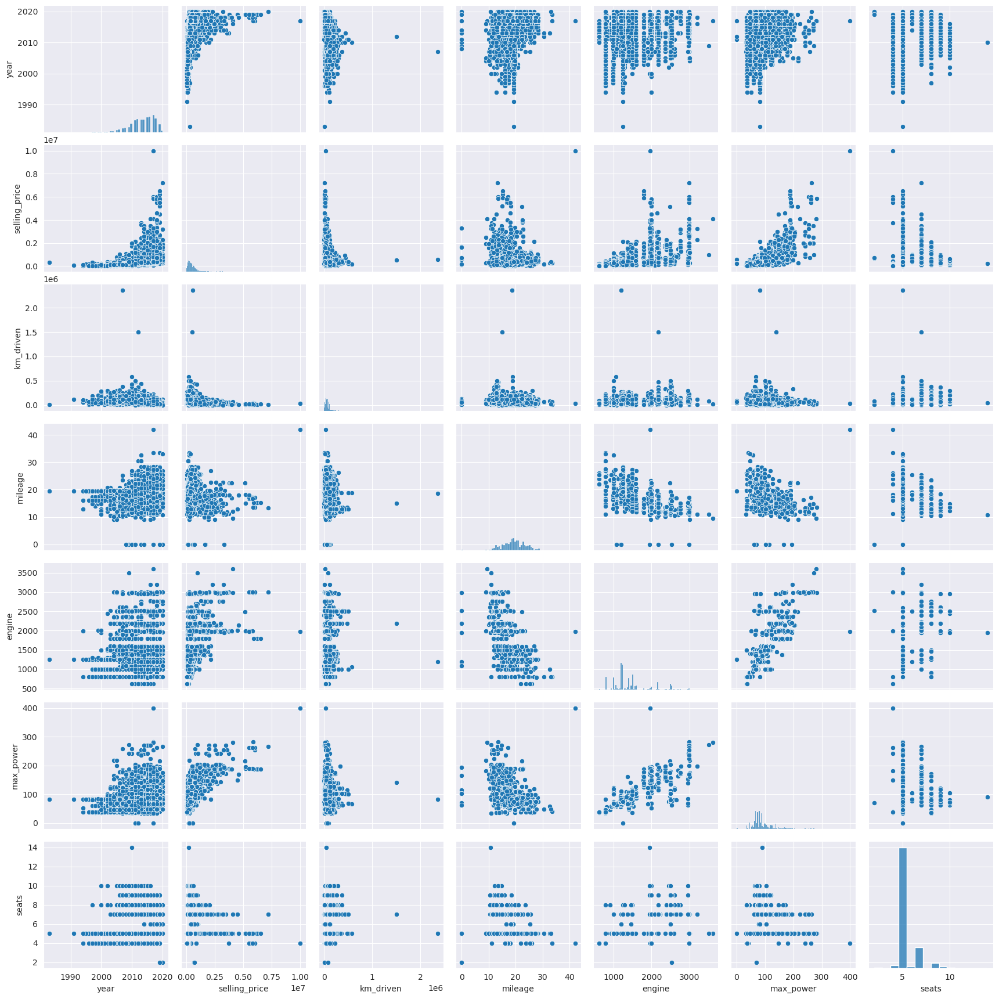

In [20]:
sns.pairplot(df_train)

Этот график не такой информативный, как можно было бы построить, беря признаки по отдельности. Но он позволяет сделать некоторые (возможно, далеко идущие) выводы. Впрочем, со многими из них (если не со всеми) вы бы справились умозрительно. Однако всегда приятно делать выводы, основываясь на данных.



* <font color='#FF6600'> Что можно сказать о связи предикторов с целевой переменной?
* А о корреляциях признаков? </font>

* Предикторы с целевой переменной имеют разные связи. Цена и год имеют квадратичную зависимость; цена с пробегом - обратную квадратичную. С признаками engine, max_power, torque целевая переменная имеет линейную зависимость. Mileage и цена - предполагаем нормальное распределение. Seats представлена в виде дискретных значений, что может говорить о том, что признак в большей степени является категориальным. 
* Между собой признаки коррелируют по-разному: где-то видна положительная линейная зависимость (engine и max_power), высокая плотность точек в некоторой области может указывать на взаимосвязь (max_power и mileage, km_driven и mileage).

(0.25 балла) <font color='#9933CC'>Постройте pairplot по тестовым данным</font> и ответьте на вопрос <font color='#FF6600'>"Похожими ли оказались совокупности при разделении на трейн и тест?"</font>

/home/kettarian/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/kettarian/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/kettarian/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/kettarian/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, Ca

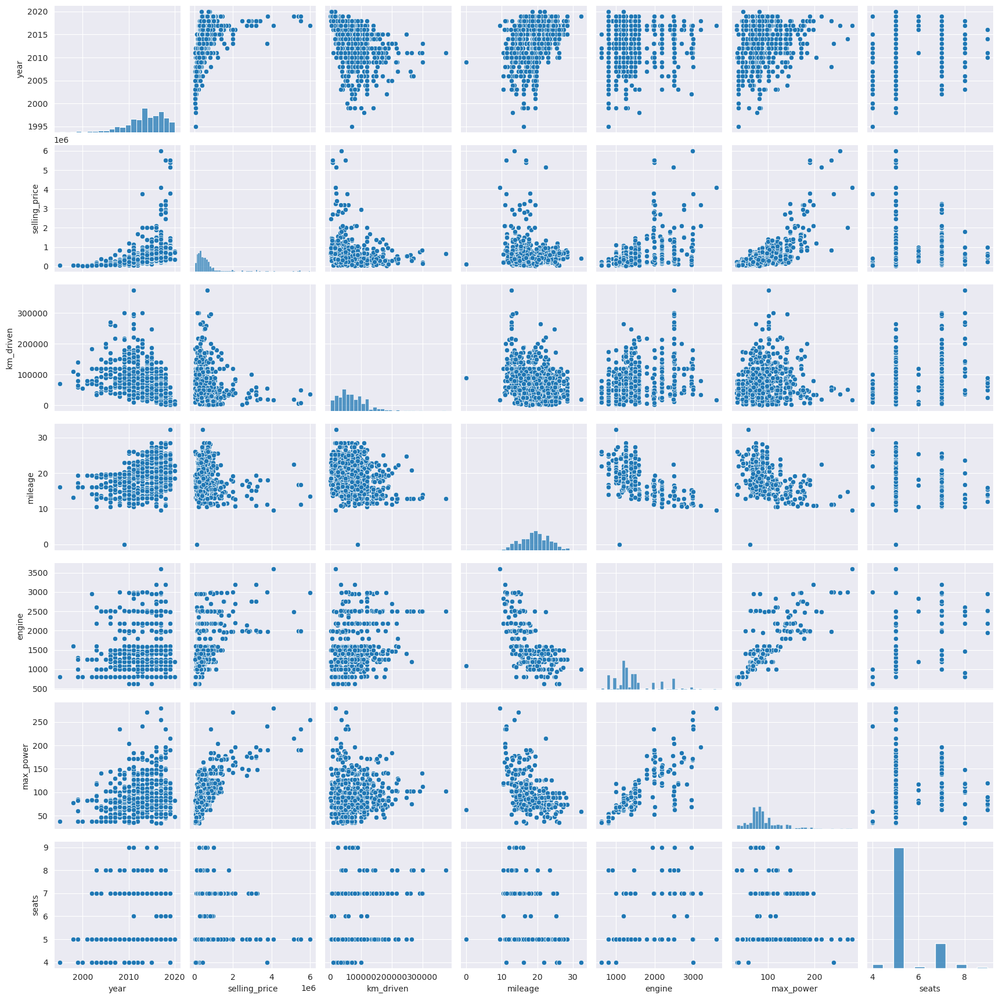

In [21]:
sns.pairplot(df_test)

В общем и целом test и train похожи друг на друга за исключением небольших деталей - как, например, максимальное количество сидений в трейне и тесте.

(0.25 балла) <font color='#9933CC'>Для трейна давайте построим тепловую карту (heatmap из библиотеки seaborn) попарных корреляций числовых колонок</font>

<Axes: >

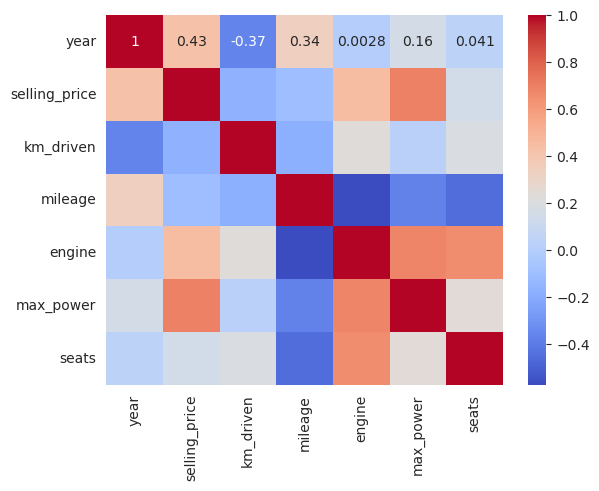

In [22]:
sns.heatmap((df_train.select_dtypes(include='number')).corr(), annot=True, cmap='coolwarm')

Ответьте, пожалуйста, на вопросы: 
* <font color='#FF6600'>Какие 2 признака наименее скоррелированы между собой?</font>
* <font color='#FF6600'>Между какими наблюдается довольно сильная положительная линейная зависимость?</font>
* <font color='#FF6600'>Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи.</font>

1. Наименее скореллированные признаки - engine и year.

2. Максимальная мощность и цена продажи; максимальная мощность и движок

3. Можно считать, учитывая отрицательную корреляцию, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи.

(0.25 балла) <font color='#9933CC'> Отобразите диаграммe рассеяния для наиболее скореллированной пары **признаков** (на трейне) </font>

/home/kettarian/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/kettarian/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


<Axes: xlabel='max_power', ylabel='engine'>

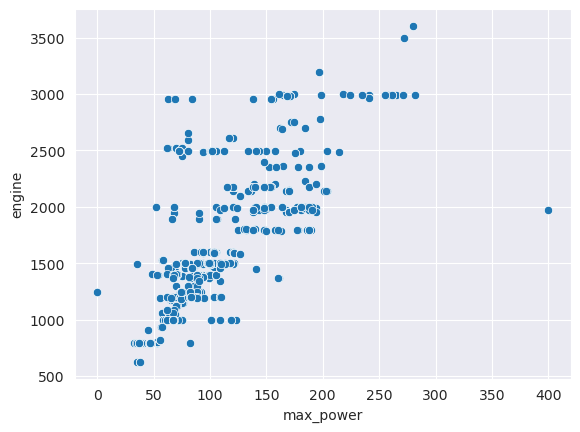

In [23]:
sns.scatterplot(x='max_power', y='engine', data=df_train)

### Дополнительные визуализации (бонус 0.5 балла)

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.

/home/kettarian/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/kettarian/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/kettarian/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


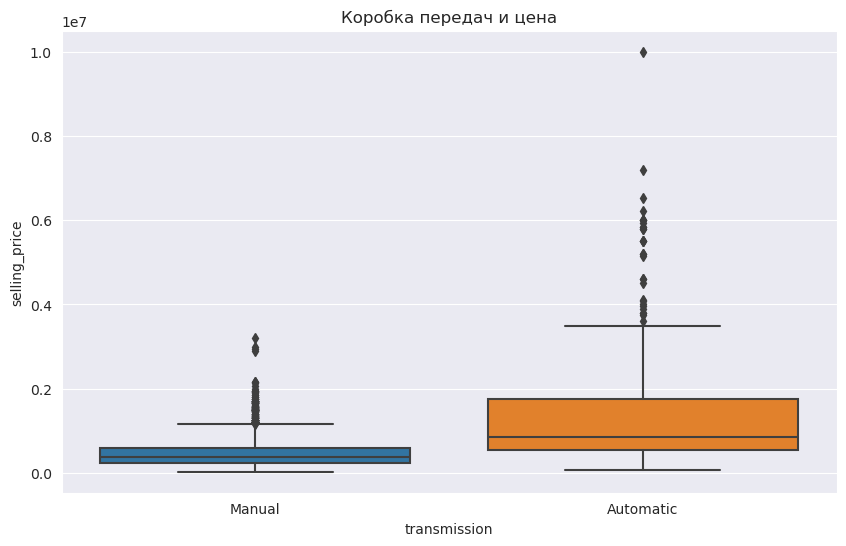

/home/kettarian/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/kettarian/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


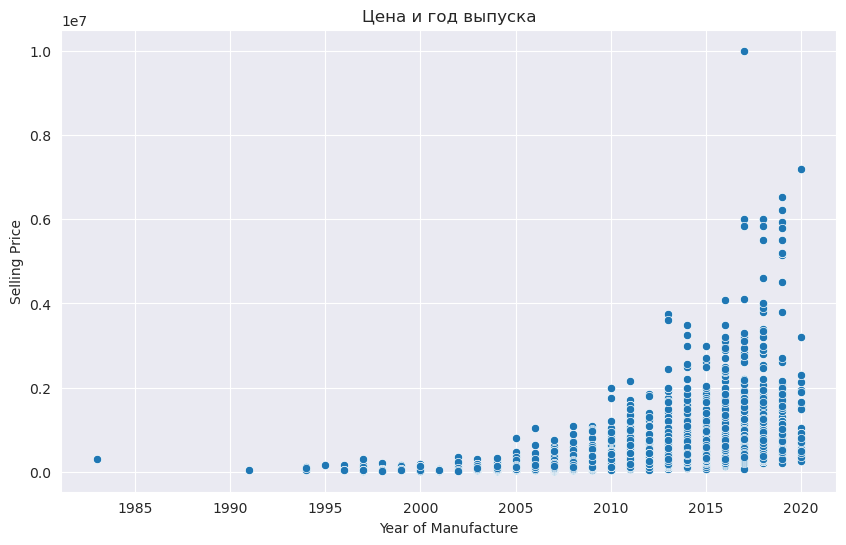

/home/kettarian/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/kettarian/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/kettarian/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


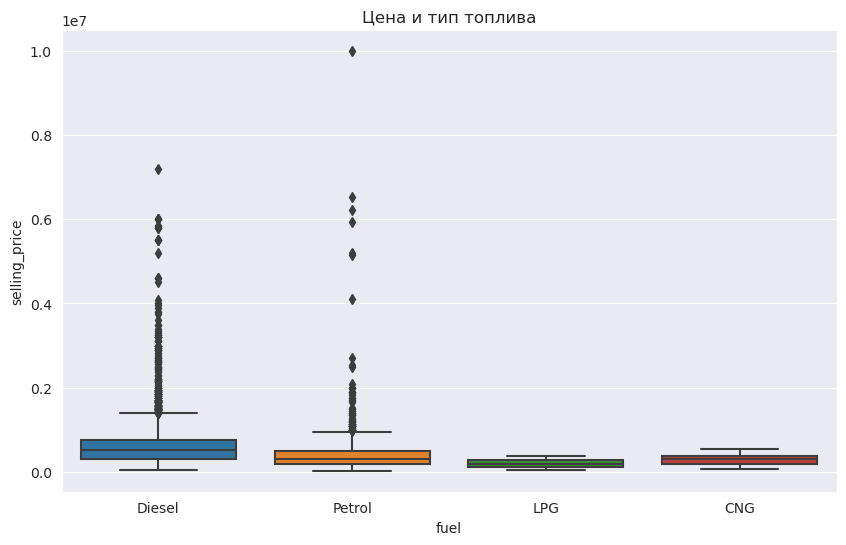

/home/kettarian/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/kettarian/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/kettarian/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


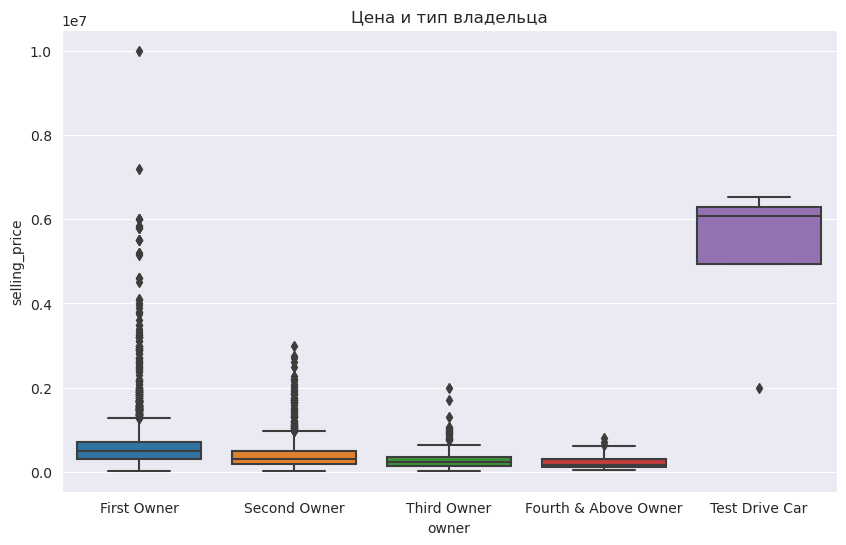

In [24]:
# Взаимосвязь между типом коробки передач и ценой
plt.figure(figsize=(10, 6))
sns.boxplot(x='transmission', y='selling_price', data=df_train)
plt.title('Коробка передач и цена')
plt.show()

# Распределение цены в зависимости от года выпуска
plt.figure(figsize=(10, 6))
sns.scatterplot(x='year', y='selling_price', data=df_train)
plt.xlabel('Year of Manufacture')
plt.ylabel('Selling Price')
plt.title('Цена и год выпуска')
plt.show()

# Взаимосвязь между типом топлива и ценой
plt.figure(figsize=(10, 6))
sns.boxplot(x='fuel', y='selling_price', data=df_train)
plt.title('Цена и тип топлива')
plt.show()

# Взаимосвязь между типом владельца и ценой
plt.figure(figsize=(10, 6))
sns.boxplot(x='owner', y='selling_price', data=df_train)
plt.title('Цена и тип владельца')
plt.show()


Первая диаграмма намекает на то, что средняя цена автомобилей с автоматической трансмиссией выше, что, вероятно, связано с их установкой на более дорогие и технологичные модели. Высокий разброс цен также может указывать на наличие особо дорогих автомобилей с автоматической трансмиссией.

На второй диаграмме рассеяния четко видна тенденция: стоимость автомобиля обычно увеличивается с уменьшением его возраста. Новые автомобили имеют более высокие цены, а разброс цен среди последних моделей может указывать на разнообразие классов, от эконом до премиум. Старые модели, в свою очередь, обычно имеют более узкий и низкий диапазон цен, что может отражать их устаревание и износ.

С третьей диаграммы видно, что дизельные автомобили в среднем стоят дороже, возможно, из-за их высокой начальной стоимости и характеристик двигателей, таких как долгий срок службы. Однако наличие выбросов, особенно среди дизельных и бензиновых автомобилей, может свидетельствовать о наличии отдельных дорогих моделей.

Четвертая диаграмма подтверждает тенденцию: автомобили с меньшим числом владельцев часто имеют более высокие цены, возможно, благодаря лучшему уходу и меньшему пробегу. Автомобили с большим числом владельцев, напротив, обычно имеют более низкие цены, что отражается в меньшем разбросе и медианных значениях цен. 

# Часть 2 (1.25 балла) | Модель только на вещественных признаках

(0.05 балла) <font color='#9933CC'>В переменные ``y_train`` и ``y_test`` запишите значения целевых переменных. Столбцы ``selling_price`` из датафреймов необходимо удалить. Категориальные (все, кроме ``seats``) столбцы тоже.</font>

In [25]:
y_train = df_train['selling_price']
X_train = df_train.drop(['selling_price', 'name', 'fuel', 'seller_type', 'transmission', 'owner'], axis=1)


In [26]:
assert X_train.shape == (5840, 6)

In [27]:
y_test = df_test['selling_price']
X_test = df_test.drop(['selling_price', 'name', 'fuel', 'seller_type', 'transmission', 'owner'], axis=1)

In [28]:
assert X_test.shape == (1000, 6)

(0.2 балла) <font color='#9933CC'>Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и MSE для трейна и для теста</font>

**Замечание:** $R^2$ и MSE для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [29]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [30]:
def metrics(model, xtrain, xtest, ytrain, ytest, name):
    print(name)
    r2 = r2_score(ytrain, model.predict(xtrain))
    mse = MSE(ytrain, model.predict(xtrain))
    print(f'Train: R2:{r2}\nMSE:{mse}')

    r2 = r2_score(ytest, model.predict(xtest))
    mse = MSE(ytest, model.predict(xtest))
    print(f'Test: R2:{r2}\nMSE:{mse}')

In [31]:
metrics(lr, X_train, X_test,  y_train, y_test, 'Simple LinReg')

Simple LinReg
Train: R2:0.5922591702157309
MSE:116874153930.02872
Test: R2:0.5941419794788401
MSE:233298779730.4565


Запомните правило:

> Использую линейную модель -- стандартизирую фичи

(0.25 балла) <font color='#9933CC'>Воспользуемся им</font>


In [32]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

lr_scale = LinearRegression()
lr_scale.fit(X_train_scaled, y_train)

metrics(lr_scale, X_train_scaled, X_test_scaled,  y_train, y_test, 'Scaled LinReg')

# your code here

Scaled LinReg
Train: R2:0.5922591702157305
MSE:116874153930.0289
Test: R2:0.5941419794788518
MSE:233298779730.44968


Не очень результативно.

Зато уже сейчас можем интерпретировать модель. <font color='#FF6600'>"Какой признак оказался наиболее информативным в предсказании цены?"</font>

In [33]:
features = X_train_scaled.columns
weights = lr_scale.coef_
feature_weights = pd.DataFrame({'Feature': features, 'Weight': weights})
feature_weights.sort_values(by='Weight')

,Feature,Weight
1,km_driven,-44158.818520
5,seats,-23209.132486
2,mileage,28833.925778
3,engine,61178.494337
0,year,152772.570846
4,max_power,322807.353259


Исходя из вышеполученного, делаем вывод, что признак с наибольшим весом - max_power

(0.25 балла) <font color='#9933CC'>Теперь попробуем Lasso-регрессию.</font> Здесь и дальше обучайте модели на нормализованных признаках

In [34]:
from sklearn.linear_model import Lasso

lasso_scale = Lasso()
lasso_scale.fit(X_train_scaled, y_train)

metrics(lasso_scale, X_train_scaled, X_test_scaled, y_train, y_test, 'Scaled Lasso')

Scaled Lasso
Train: R2:0.5922591701804456
MSE:116874153940.1429
Test: R2:0.5941408124026636
MSE:233299450599.1693


<font color='#FF6600'>Занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Почему же?</font>

L1-регуляризация с дефолтными параметрами (alpha=1.0) не занулила веса, т.к. добавляется слишком маленький штраф; необходимо подобрать alpha значением повыше. Если признаки имеют разный масштаб, то также на силу регуляризации может влиять и масштабирование признаков.

(0.25 балла) <font color='#9933CC'>Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии</font>

Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).

In [35]:
from sklearn.model_selection import GridSearchCV
params = {
    'alpha': list(np.arange(1, 30000, 10)),
    'max_iter': [1000, 2000, 3000, 4000]
}

grid = GridSearchCV(Lasso(), params, cv=10, verbose=1)
grid.fit(X_train_scaled, y_train)

Fitting 10 folds for each of 12000 candidates, totalling 120000 fits


GridSearchCV(cv=10, estimator=Lasso(),
             param_grid={'alpha': [1, 11, 21, 31, 41, 51, 61, 71, 81, 91, 101,
                                   111, 121, 131, 141, 151, 161, 171, 181, 191,
                                   201, 211, 221, 231, 241, 251, 261, 271, 281,
                                   291, ...],
                         'max_iter': [1000, 2000, 3000, 4000]},
             verbose=1)

In [36]:
best_cv = grid.best_estimator_
print(grid.best_params_)
metrics(best_cv, X_train_scaled, X_test_scaled, y_train, y_test, 'Grid Lasso')

{'alpha': 26611, 'max_iter': 1000}
Grid Lasso
Train: R2:0.582580672295113
MSE:119648382491.79495
Test: R2:0.5645066451464494
MSE:250334016160.607


<font color='#FF6600'>Сколько грид-сёрчу пришлось обучать моделей?</font>

<font color='#FF6600'>Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?</font>

Подбор гиперпараметра был произведен при заданной максимально возможной величине коэффицента регуляризации 30000, произведено обучение 120000 моделей. По итогу альфа при второй итерации составила 26610. Данная регуляризация зануляет веса mileage, engine и seats. 

In [37]:
grid.best_params_

{'alpha': 26611, 'max_iter': 1000}

In [38]:
features = X_train_scaled.columns
weights = best_cv.coef_
feature_weights = pd.DataFrame({'Feature': features, 'Weight': weights})
feature_weights.sort_values(by='Weight')

,Feature,Weight
1,km_driven,-15731.973614
2,mileage,0.000000
3,engine,0.000000
5,seats,-0.000000
0,year,145858.577730
4,max_power,321819.693141


(0.25 балла) <font color='#9933CC'>Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html)-регрессии</font>

In [39]:
from sklearn.linear_model import ElasticNet

from sklearn.model_selection import GridSearchCV
params = {
    'alpha': list(np.arange(0.1, 10, 0.1)),
    'l1_ratio': list(np.arange(0, 1, 0.01)),
    'max_iter': [1000, 2000, 3000, 4000]
}
grid = GridSearchCV(ElasticNet(), params, cv=10, verbose=1)
grid.fit(X_train_scaled, y_train)

Fitting 10 folds for each of 39600 candidates, totalling 396000 fits


/home/kettarian/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.804e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/home/kettarian/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.523e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers impl

GridSearchCV(cv=10, estimator=ElasticNet(),
             param_grid={'alpha': [0.1, 0.2, 0.30000000000000004, 0.4, 0.5, 0.6,
                                   0.7000000000000001, 0.8, 0.9, 1.0, 1.1,
                                   1.2000000000000002, 1.3000000000000003,
                                   1.4000000000000001, 1.5000000000000002, 1.6,
                                   1.7000000000000002, 1.8000000000000003,
                                   1.9000000000000001, 2.0, 2.1, 2.2,
                                   2.3000000000000003, 2.4000000000000004,
                                   2.5000000000000004, 2.6, 2.7,
                                   2.8000000000000003, 2.9000000000000004,
                                   3.0000000000000004, ...],
                         'l1_ratio': [0.0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06,
                                      0.07, 0.08, 0.09, 0.1, 0.11, 0.12, 0.13,
                                      0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2,
                                      0.21, 0.22, 0.23, 0.24, 0.25, 0.26, 0.27,
                                      0.28, 0.29, ...],
                         'max_iter': [1000, 2000, 3000, 4000]},
             verbose=1)

In [40]:
best_cv = grid.best_estimator_
metrics(best_cv, X_train_scaled, X_test_scaled, y_train, y_test, 'Grid ElasticNet')

Grid ElasticNet
Train: R2:0.5848640752232629
MSE:118993871670.66852
Test: R2:0.562360788025413
MSE:251567516110.09885


<font color='#FF6600'>Какие гиперпараметры соответствуют лучшей из перебранных моделей?</font>

In [41]:
grid.best_estimator_

ElasticNet(alpha=7.3, l1_ratio=0.98)

Предлагаем вам оставить вам попытки заметно улучшить качество модели регуляризацией и перейти к следующей части задания.

# Часть 3 (0.5 балла) | Добавляем категориальные фичи



(0 баллов) <font color='#9933CC'>Из ``df_train`` удалите столбцы с целевой переменной и названием автомобиля.</font>

In [42]:
X_train_cat = df_train.drop(['name', 'selling_price'], axis=1)
X_train_cat

,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,2014,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,5
1,2014,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,5
2,2010,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,5
3,2007,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,5
4,2017,45000,Petrol,Individual,Manual,First Owner,20.14,1197,81.86,5
...,...,...,...,...,...,...,...,...,...,...
5835,2008,191000,Petrol,Individual,Manual,First Owner,17.92,1086,62.10,5
5836,2013,50000,Petrol,Individual,Manual,Second Owner,18.90,998,67.10,5
5837,2013,110000,Petrol,Individual,Manual,First Owner,18.50,1197,82.85,5
5838,2007,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493,110.00,5


In [43]:
assert X_train_cat.shape == (5840, 10)

In [44]:
X_train_cat.describe(include='object')

,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840
unique,4,3,2,5
top,Diesel,Individual,Manual,First Owner
freq,3177,5223,5336,3603


(0.5 балла) <font color='#9933CC'>Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования</font>

> Обратите внимание, что во избежание мультиколлинеарности следует избавиться от одного из полученных столбцов при кодировании каждого признака методом OneHot. 

In [45]:
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(handle_unknown='ignore')
cat_features = X_train_cat.select_dtypes(include=['object']).columns
X_train_con = pd.concat([X_train_cat[cat_features], X_train_cat['seats'].astype(str)], axis=1)
X_train_encoded = encoder.fit_transform(X_train_con)
X_train_encoded_df = pd.DataFrame(X_train_encoded.toarray(), columns=encoder.get_feature_names_out(list(X_train_con.columns)))
X_train_cat = X_train_cat.drop(cat_features, axis=1)
X_train_cat = pd.concat([X_train_cat, X_train_encoded_df.astype(int)], axis=1).drop(['seats'], axis=1)

(0.25 балла) <font color='#9933CC'>Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV`.</font> В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.

<font color='#FF6600'>Удалось ли улучшить качество предсказаний?</font>

In [46]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

params = {
    'alpha': list(np.arange(0.1, 1000, 0.1)),
}
        
grid = GridSearchCV(Ridge(), params, cv=10, verbose=2)
grid.fit(X_train_cat, y_train)

Fitting 10 folds for each of 9999 candidates, totalling 99990 fits
[CV] END ..........................................alpha=0.1; total time=   0.1s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ..........................................alpha=0.2; total time=   0.0s
[CV] END .................................

GridSearchCV(cv=10, estimator=Ridge(),
             param_grid={'alpha': [0.1, 0.2, 0.30000000000000004, 0.4, 0.5, 0.6,
                                   0.7000000000000001, 0.8, 0.9, 1.0, 1.1,
                                   1.2000000000000002, 1.3000000000000003,
                                   1.4000000000000001, 1.5000000000000002, 1.6,
                                   1.7000000000000002, 1.8000000000000003,
                                   1.9000000000000001, 2.0, 2.1, 2.2,
                                   2.3000000000000003, 2.4000000000000004,
                                   2.5000000000000004, 2.6, 2.7,
                                   2.8000000000000003, 2.9000000000000004,
                                   3.0000000000000004, ...]},
             verbose=2)

In [47]:
X_test_cat = df_test.drop(['name', 'selling_price'], axis=1)
categorical_features = X_test_cat.select_dtypes(include=['object']).columns
X_test_con = pd.concat([X_test_cat[categorical_features], X_test_cat['seats'].astype(str)], axis=1)
X_test_ohe = encoder.transform(X_test_con)
X_test_ohe_df = pd.DataFrame(X_test_ohe.toarray(), columns=encoder.get_feature_names_out(list(X_test_con.columns)))
X_test_cat = X_test_cat.drop(categorical_features, axis=1)
X_test_cat = pd.concat([X_test_cat, X_test_ohe_df.astype(int)], axis=1).drop(['seats'], axis=1)


Относительно предыдущей модели R2 улучшился на 0.33 на трейне и на 0.08 - на тесте.

# Часть 4 - бонусная (1.5 балла) | Feature Engineering 

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 2-х баллов в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

Попробуем добавить в качестве нового признака марку автомобиля:

In [48]:
name = df_train['name']
model_cars = name.str.split(' ', n=1, expand=True)
X_train_cat['model'] = model_cars[0]
X_train_models = encoder.fit_transform(X_train_cat[['model']])
X_train_models_df = pd.DataFrame(X_train_models.toarray(), columns=encoder.get_feature_names_out(['model'])).astype(int)
X_train_cat = X_train_cat.drop(['model'], axis=1)
X_train_cat_models = pd.concat([X_train_cat, X_train_models_df], axis=1)

name = df_test['name']
model_cars = name.str.split(' ', n=1, expand=True)
X_test_cat['model'] = model_cars[0]
X_test_models = encoder.transform(X_test_cat[['model']])
X_test_models_df = pd.DataFrame(X_test_models.toarray(), columns=encoder.get_feature_names_out(['model'])).astype(int)
X_test_cat = X_test_cat.drop(['model'], axis=1)
X_test_cat_models = pd.concat([X_test_cat, X_test_models_df], axis=1)

In [49]:
# Применим масштабирование признаков

scaler = StandardScaler()

X_train_only_num = X_train_cat_models[['year', 'km_driven', 'mileage', 'engine', 'max_power']]
X_train_cat_models = X_train_cat_models.drop(['year', 'km_driven', 'mileage', 'engine', 'max_power'], axis=1)
X_train_scaled = scaler.fit_transform(X_train_only_num)
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train_only_num.columns)
X_train_scaled = pd.concat([X_train_scaled, X_train_cat_models], axis=1)

X_test_only_num = X_test_cat_models[['year', 'km_driven', 'mileage', 'engine', 'max_power']]
X_test_cat_models = X_test_cat_models.drop(['year', 'km_driven', 'mileage', 'engine', 'max_power'], axis=1)
X_test_scaled = scaler.transform(X_test_only_num)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test_only_num.columns)
X_test_scaled = pd.concat([X_test_scaled, X_test_cat_models], axis=1)

In [50]:
# т.к. по результатам прошлого шага лучшей моделью оказалась Ridge, то будем использовать ее

params = {
    'alpha': list(np.arange(0.001, 0.01, 0.001)),
    'max_iter': [15000, 30000]
}
      
grid = GridSearchCV(Ridge(), params, cv=10, verbose=1)
grid.fit(X_train_scaled, y_train)

best_cv = grid.best_estimator_
metrics(best_cv, X_train_scaled, X_test_scaled, y_train, y_test, 'Grid Search Ridge')

Fitting 10 folds for each of 18 candidates, totalling 180 fits
Grid Search Ridge
Train: R2:0.7737540938906009
MSE:64850750587.47256
Test: R2:0.7846179318339945
MSE:123807763154.28592


In [51]:
grid.best_params_

{'alpha': 0.009000000000000001, 'max_iter': 15000}

По итогам подняли R2 на трейне ~на 0.33; на тесте - на 0.14.

In [52]:
# Добавим в модель полиноминальные признаки и посмотрим на результат.

from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(3)

X_train_only_num = X_train_scaled[['year', 'km_driven', 'mileage', 'engine', 'max_power']]
X_train_cat_models = X_train_scaled.drop(['year', 'km_driven', 'mileage', 'engine', 'max_power'], axis=1)
X_train_scaled = poly.fit_transform(X_train_only_num)
columns_poly = poly.get_feature_names_out(X_train_only_num.columns)
X_train_scaled = pd.DataFrame(X_train_scaled, columns=columns_poly)
X_train_scaled = pd.concat([X_train_scaled, X_train_cat_models], axis=1)

X_test_only_num = X_test_scaled[['year', 'km_driven', 'mileage', 'engine', 'max_power']]
X_test_cat_models = X_test_scaled.drop(['year', 'km_driven', 'mileage', 'engine', 'max_power'], axis=1)
X_test_scaled = poly.transform(X_test_only_num)
columns_poly = poly.get_feature_names_out(X_train_only_num.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=columns_poly)
X_test_scaled = pd.concat([X_test_scaled, X_test_cat_models], axis=1)

In [53]:
best_one = Ridge(alpha=0.009, max_iter=15000)
best_one.fit(X_train_scaled, y_train)

Ridge(alpha=0.009, max_iter=15000)

In [54]:
metrics(best_one, X_train_scaled, X_test_scaled, y_train, y_test, 'ElasticNet')

ElasticNet
Train: R2:0.9185255470387058
MSE:23353701815.44317
Test: R2:0.9210427963610428
MSE:45386855325.03232


# Часть Бизнесовая (0.5 балла)

Заказчик просил вас посчитать кастомную метрику -- среди всех предсказанных цен на авто посчитать долю предиктов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

<font color='#9933CC'>Сделайте это самостоятельно для лучшей из своих моделей</font>

In [55]:
def business_metrics(y_true, y_pred):
    yratio = (y_pred - y_true) / y_true * 100
    y_pred_no_more_10 = y_pred[abs(yratio) <= 10]
    return len(y_pred_no_more_10) / len(y_pred)

print(f'Доля предиктов, отличающихся от реальных цен на авто не более чем на 10% (в одну или другую сторону):{business_metrics(y_test, best_one.predict(X_test_scaled))}.')

Доля предиктов, отличающихся от реальных цен на авто не более чем на 10% (в одну или другую сторону):0.377.


In [93]:
import pickle

file = {"coef":best_one.coef_, "params":best_one.get_params(), 
        "feature": best_one.feature_names_in_, "intercept": best_one.intercept_}
pickle.dump(file, open( "model.pickle", "wb" ))
pickle.dump(scaler, open("scaler.pickle","wb"))

# Часть 5 (2.5 балла) | Реализация сервиса на FastAPI

Cделайте с помощью FastAPI сервис, который с точки зрения пользователя реализует две функции:

1. на вход в формате json подаются признаки одного объекта, на выходе сервис выдает предсказанную стоимость машины
2. на вход подается csv-файл с признаками тестовых объектов, на выходе получаем файл с +1 столбцом - предсказаниями на этих объектах

С точки зрения реализации это означает следующее:
- средствами pydantic должен быть описан класс базового объекта
- класс с коллецией объектов
- метод post, который получает на вход один объект описанного класса
- метод post, который получает на вход коллекцию объектов описанного класса

Шаблон для сервисной части дан ниже. Код необходимо дополнить и оформить в виде отдельного .py-файла.

In [3]:
from fastapi import FastAPI
from pydantic import BaseModel
from typing import List
import pandas as pd
import numpy as np
import pickle
app = FastAPI()

with open("model.pkl", "rb") as model_file:
    model = pickle.load(model_file)

class Item(BaseModel):
    name: str
    year: int
    selling_price: int
    km_driven: int
    fuel: str
    seller_type: str
    transmission: str
    owner: str
    mileage: str 
    engine: str
    max_power: str
    torque: str
    seats: float

class Items(BaseModel):
    objects: List[Item]

def process_columns(df):
    # Убираем единицы измерения и кастуем к float
    df['mileage'] = df['mileage'].str.extract('(\d+\.\d+|\d+)').astype(float)
    df['engine'] = df['engine'].str.extract('(\d+)').astype(float)
    df['max_power'] = df['max_power'].str.extract('(\d+\.\d+|\d+)').astype(float)

    return df

def transform_data(data):
    data = process_columns(data)
    categorical_columns = ['name', 'fuel', 'seller_type', 'transmission', 'owner']
    data['year_squared'] = data['year'] ** (2) 
    data['preservation'] = 1 / (data['mileage'] + 1)
    data['mp_eng'] = data['max_power'] * data['engine']
    data['pow/vol'] = data['max_power'] / data['engine']
    data['km/year'] = data['km_driven'] / data['year']
    data['efficiency'] = data['km_driven'] * data['mileage'] * data['year'] * data['engine']
    data['transportation'] = data['max_power'] / data['seats'] 
    data['trans_val'] = np.where(data['transmission'] == 'Automatic', 100000, 200000)
    data['fuel_val'] = np.where(data['fuel'] == 'Diesel', 50000, 200000)
    data['benefit'] = data['fuel_val'] / (data['efficiency'] + 1)
    print(data.columns)
    return data.drop(['selling_price', 'torque'] + categorical_columns, axis=1)

@app.post("/predict_item")
def predict_item(item: Item) -> float:
    # Преобразование данных в формат, подходящий для вашей модели
    data = transform_data(pd.DataFrame([item.dict()]))  # преобразование одного объекта в DataFrame
    prediction = model.predict(data)  # предсказание стоимости машины
    return float(prediction[0])  # возвращаем предсказание в виде float

@app.post("/predict_items")
def predict_items(items: Items) -> List[float]:
    # Преобразование данных в формат, подходящий для вашей модели
    data = pd.DataFrame([item.dict() for item in items.objects])  # преобразование списка объектов в DataFrame
    predictions = model.predict(data)  # предсказание стоимости машин
    return predictions.tolist()  # возвращаем предсказания в виде списка float

/home/kettarian/anaconda3/lib/python3.11/site-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator Ridge from version 1.3.0 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Протестируйте сервис на корректность работы и приложите скриншоты (см. ниже).

# Часть 6 (1 балл) | Оформление результатов

**Результаты вашей работы** необходимо разместить в своем Гитхабе. Под результатами понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* ``.py``-файл с реализацией сервиса
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)

**Как будет выглядет проверка всего домашнего задания?**
1. Ассистент проходит по ссылке на (**открытый**) репозиторий из Энитаска
2. Смотрит ``readme.md``:
    * пожалуйста, приложите в него же скрины работы вашего сервиса -- собирать ваши проекты довольно времязатратно, но хочется убедиться, что всё работает
    * можете прислать screencast в ТГ
3. Просматривает ноутбук с pure-DS частью
4. Заглядывает в код сервиса
5. Хвалит

# Часть Благодарственная

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Потому что здесь награда за старания. Пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой.

https://drive.google.com/file/d/1LT06nyg9QgVi3r-D5BY-_mQ9TcJQFxJN/view?usp=share_link